# Setup
1. In colab: Go to "Runtime" -> "Change runtime type" -> Select "T4 GPU"
2. Install TerraTorch

In [1]:
!pip install terratorch==0.99.9 gdown tensorboard


[notice] A new release of pip is available: 24.2 -> 25.0.1
[notice] To update, run: pip install --upgrade pip


In [2]:
import os
import sys
import torch
import gdown
import terratorch
import albumentations
import lightning.pytorch as pl
import matplotlib.pyplot as plt
from terratorch.datamodules import MultiTemporalCropClassificationDataModule
import warnings
os.environ["TENSORBOARD_PROXY_URL"]= os.environ["NB_PREFIX"]+"/proxy/6006/"
warnings.filterwarnings('ignore')

INFO:terratorch:granitewxc not installed, please use pip install granitewxc


3. Download the dataset from Google Drive

In [4]:
# Download a random subset for demos (~1 GB)
if not os.path.isfile('multi-temporal-crop-classification-subset.tar.gz'):
    gdown.download("https://drive.google.com/uc?id=1LL6thkuKA0kVyMI39PxgsrJ1FJJDV7-u")

if not os.path.isdir('multi-temporal-crop-classification-subset/'):
    !tar -xzvf multi-temporal-crop-classification-subset.tar.gz

dataset_path = "multi-temporal-crop-classification-subset"

multi-temporal-crop-classification-subset/
multi-temporal-crop-classification-subset/._.DS_Store
tar: Ignoring unknown extended header keyword 'SCHILY.fflags'
tar: Ignoring unknown extended header keyword 'LIBARCHIVE.xattr.com.apple.FinderInfo'
multi-temporal-crop-classification-subset/.DS_Store
multi-temporal-crop-classification-subset/._training_chips
tar: Ignoring unknown extended header keyword 'LIBARCHIVE.xattr.com.apple.quarantine'
multi-temporal-crop-classification-subset/training_chips/
multi-temporal-crop-classification-subset/._validation_chips
tar: Ignoring unknown extended header keyword 'LIBARCHIVE.xattr.com.apple.quarantine'
multi-temporal-crop-classification-subset/validation_chips/
multi-temporal-crop-classification-subset/._training_data.txt
tar: Ignoring unknown extended header keyword 'LIBARCHIVE.xattr.com.apple.provenance'
tar: Ignoring unknown extended header keyword 'LIBARCHIVE.xattr.com.apple.metadata:kMDLabel_bp7lphfqfrx4tmrnekvg6mbqxu'
tar: Ignoring unknown ext

## Multi-temporal Crop Dataset

Lets start with analyzing the dataset


In [5]:
!ls "{dataset_path}"

training_chips	training_data.txt  validation_chips  validation_data.txt


In [6]:
# Each merged sample includes the stacked bands of three time steps
!ls "{dataset_path}/training_chips" | head

chip_003_062.mask.tif
chip_003_062_merged.tif
chip_003_063.mask.tif
chip_003_063_merged.tif
chip_010_063.mask.tif
chip_010_063_merged.tif
chip_019_091.mask.tif
chip_019_091_merged.tif
chip_022_126.mask.tif
chip_022_126_merged.tif
ls: write error: Broken pipe


In [7]:
# Adjusted dataset class for this dataset (general dataset could be used as well)
datamodule = MultiTemporalCropClassificationDataModule(
    batch_size=8,
    num_workers=2,
    data_root=dataset_path,
    train_transform=[
        terratorch.datasets.transforms.FlattenTemporalIntoChannels(),  # Required for temporal data
        albumentations.D4(), # Random flips and rotation
        albumentations.pytorch.transforms.ToTensorV2(),
        terratorch.datasets.transforms.UnflattenTemporalFromChannels(n_timesteps=3),
    ],
    val_transform=None,  # Using ToTensor() by default
    test_transform=None,
    expand_temporal_dimension=True,
    use_metadata=False, # The crop dataset has metadata for location and time
    reduce_zero_label=True,
)

# Setup train and val datasets
datamodule.setup("fit")

In [8]:
# checking for the dataset means and stds
datamodule.means, datamodule.stds

([494.905781, 815.239594, 924.335066, 2968.881459, 2634.621962, 1739.579917],
 [284.925432, 357.84876, 575.566823, 896.601013, 951.900334, 921.407808])

In [9]:
# checking datasets train split size
train_dataset = datamodule.train_dataset
len(train_dataset)

462

In [10]:
# checking datasets available bands
train_dataset.all_band_names

('BLUE', 'GREEN', 'RED', 'NIR_NARROW', 'SWIR_1', 'SWIR_2')

In [11]:
# checking datasets classes
train_dataset.class_names

('Natural Vegetation',
 'Forest',
 'Corn',
 'Soybeans',
 'Wetlands',
 'Developed / Barren',
 'Open Water',
 'Winter Wheat',
 'Alfalfa',
 'Fallow / Idle Cropland',
 'Cotton',
 'Sorghum',
 'Other')

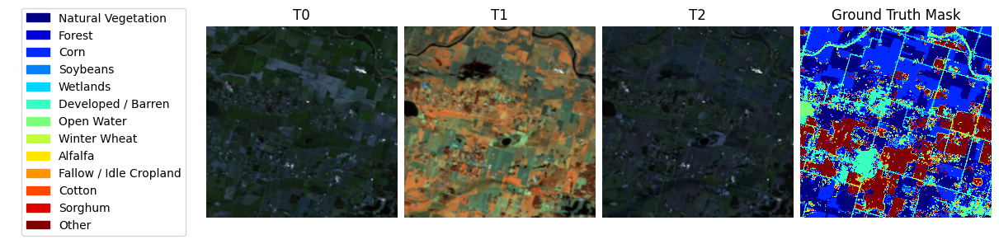

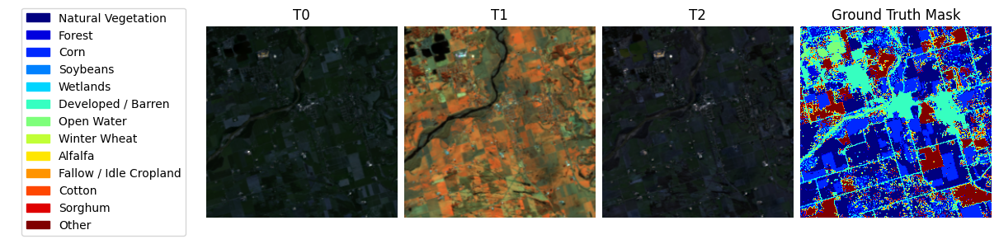

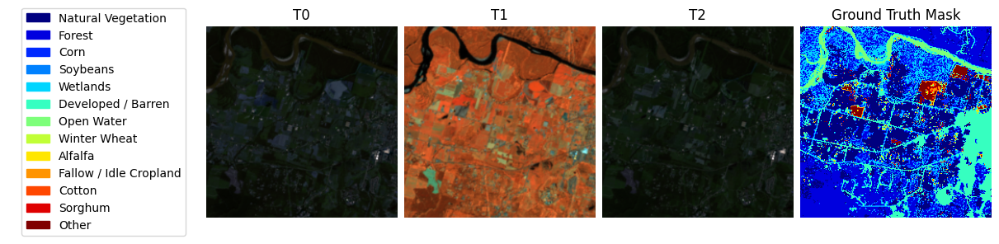

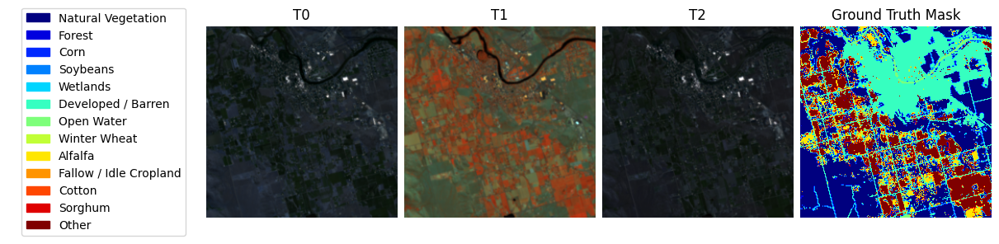

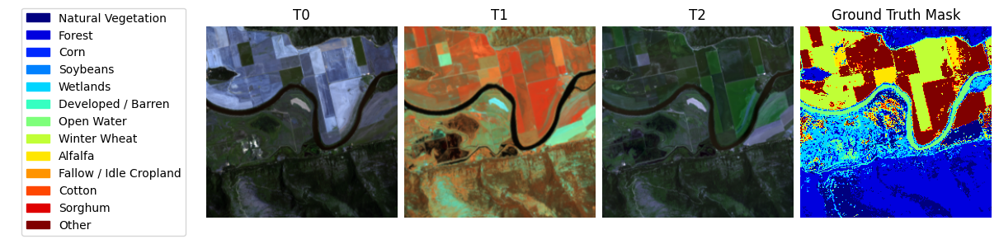

In [12]:
# plotting a few samples
for i in range(5):
    train_dataset.plot(train_dataset[i])

In [13]:
# checking datasets validation split size
val_dataset = datamodule.val_dataset
len(val_dataset)

250

In [14]:
# checking datasets testing split size
datamodule.setup("test")
test_dataset = datamodule.test_dataset
len(test_dataset)

250

# Fine-tune Prithvi

In [15]:
pl.seed_everything(0)

checkpoint_callback = pl.callbacks.ModelCheckpoint(
    dirpath="output/multicrop/checkpoints/",
    mode="max",
    monitor="val/Multiclass_Jaccard_Index", # Variable to monitor
    filename="best-{epoch:02d}",
)

# Lightning Trainer
trainer = pl.Trainer(
    accelerator="auto",
    strategy="auto",
    devices=1, # Lightning multi-gpu often fails in notebooks
    precision='bf16-mixed',  # Speed up training
    num_nodes=1,
    logger=True, # Uses TensorBoard by default
    max_epochs=1, # For demos
    log_every_n_steps=5,
    enable_checkpointing=True,
    callbacks=[checkpoint_callback, pl.callbacks.RichProgressBar()],
    default_root_dir="output/multicrop",
)

# Model
model = terratorch.tasks.SemanticSegmentationTask(
    model_factory="EncoderDecoderFactory",
    model_args={
        # Backbone
        "backbone": "prithvi_eo_v2_300_tl", # Model can be either prithvi_eo_v1_100, prithvi_eo_v2_300, prithvi_eo_v2_300_tl, prithvi_eo_v2_600, prithvi_eo_v2_600_tl
        "backbone_pretrained": True,
        "backbone_num_frames": 3,
        "backbone_bands": ["BLUE", "GREEN", "RED", "NIR_NARROW", "SWIR_1", "SWIR_2"],
        "backbone_coords_encoding": [], # use ["time", "location"] for time and location metadata
        
        # Necks 
        "necks": [
            {
                "name": "SelectIndices",
                # "indices": [2, 5, 8, 11] # indices for prithvi_eo_v1_100
                "indices": [5, 11, 17, 23] # indices for prithvi_eo_v2_300
                # "indices": [7, 15, 23, 31] # indices for prithvi_eo_v2_600
            },
            {
                "name": "ReshapeTokensToImage",
                "effective_time_dim": 3
            },
            {"name": "LearnedInterpolateToPyramidal"},            
        ],
        
        # Decoder
        "decoder": "UNetDecoder",
        "decoder_channels": [512, 256, 128, 64],
        
        # Head
        "head_dropout": 0.1,
        "num_classes": 13,
    },
    
    loss="ce",
    lr=1e-4,
    optimizer="AdamW",
    ignore_index=-1,
    freeze_backbone=True,  # Speeds up fine-tuning
    freeze_decoder=False,
    plot_on_val=True,
    
)

Seed set to 0
Using bfloat16 Automatic Mixed Precision (AMP)
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs


config.json:   0%|          | 0.00/776 [00:00<?, ?B/s]

Prithvi_EO_V2_300M_TL.pt:   0%|          | 0.00/1.33G [00:00<?, ?B/s]

INFO:root:Loaded weights for HLSBands.BLUE in position 0 of patch embed
INFO:root:Loaded weights for HLSBands.GREEN in position 1 of patch embed
INFO:root:Loaded weights for HLSBands.RED in position 2 of patch embed
INFO:root:Loaded weights for HLSBands.NIR_NARROW in position 3 of patch embed
INFO:root:Loaded weights for HLSBands.SWIR_1 in position 4 of patch embed
INFO:root:Loaded weights for HLSBands.SWIR_2 in position 5 of patch embed


In [16]:
%reload_ext tensorboard
%tensorboard --logdir output/multicrop

In [17]:
# Training
trainer.fit(model, datamodule=datamodule)

LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


┏━━━┳━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━┳━━━━━━━━┳━━━━━━━┓
┃   ┃ Name          ┃ Type             ┃ Params ┃ Mode  ┃
┡━━━╇━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━╇━━━━━━━━╇━━━━━━━┩
│ 0 │ model         │ PixelWiseModel   │  383 M │ train │
│ 1 │ criterion     │ CrossEntropyLoss │      0 │ train │
│ 2 │ train_metrics │ MetricCollection │      0 │ train │
│ 3 │ val_metrics   │ MetricCollection │      0 │ train │
│ 4 │ test_metrics  │ ModuleList       │      0 │ train │
└───┴───────────────┴──────────────────┴────────┴───────┘

Trainable params: 79.9 M                                                                                           
Non-trainable params: 303 M                                                                                        
Total params: 383 M                                                                                                
Total estimated model params size (MB): 1.5 K                                                                      
Modules in train mode: 617                                                                                         
Modules in eval mode: 0

Output()

`Trainer.fit` stopped: `max_epochs=1` reached.


In [18]:
best_ckpt_path = "output/multicrop/checkpoints/best-epoch=00.ckpt"

In [19]:
def run_test_and_plot(model, ckpt_path):

    # calculate test metrics
    trainer.test(model, datamodule=datamodule, ckpt_path=ckpt_path)

    # get predictions
    preds = trainer.predict(model, datamodule=datamodule, ckpt_path=ckpt_path)

    # get data 
    data_loader = trainer.predict_dataloaders
    batch = next(iter(data_loader))

    # plot
    BATCH_SIZE = 8
    for i in range(BATCH_SIZE):

        sample = {key: batch[key][i] for key in batch}
        sample["prediction"] = preds[0][0][i].cpu().numpy()

        datamodule.predict_dataset.plot(sample)
        

Restoring states from the checkpoint path at output/multicrop/checkpoints/best-epoch=00.ckpt
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
Loaded model weights from the checkpoint at output/multicrop/checkpoints/best-epoch=00.ckpt


Output()

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃             Test metric             ┃            DataLoader 0             ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│      test/Multiclass_Accuracy       │         0.28025615215301514         │
│      test/Multiclass_F1_Score       │         0.28025615215301514         │
│    test/Multiclass_Jaccard_Index    │         0.13913150131702423         │
│ test/Multiclass_Jaccard_Index_Micro │         0.1629638820886612          │
│              test/loss              │         2.2402760982513428          │
│      test/multiclassaccuracy_0      │         0.2896057367324829          │
│      test/multiclassaccuracy_1      │         0.2218836545944214          │
│     test/multiclassaccuracy_10      │        0.0012584453215822577        │
│     test/multiclassaccuracy_11      │         0.03325158357620239         │
│     test/multiclassaccuracy_12      │         0.15731139481067657         │
│      test/multiclassaccuracy_2      │         0.03429081663489342         │
│      test/multiclassaccuracy_3      │         0.5064272284507751          │
│      test/multiclassaccuracy_4      │          0.594697117805481          │
│      test/multiclassaccuracy_5      │         0.4345349371433258          │
│      test/multiclassaccuracy_6      │         0.6479724049568176          │
│      test/multiclassaccuracy_7      │         0.5518847107887268          │
│      test/multiclassaccuracy_8      │         0.07109130173921585         │
│      test/multiclassaccuracy_9      │        0.011593936011195183         │
│    test/multiclassjaccardindex_0    │         0.23054368793964386         │
│    test/multiclassjaccardindex_1    │         0.16075628995895386         │
│   test/multiclassjaccardindex_10    │        0.0012392279459163547        │
│   test/multiclassjaccardindex_11    │        0.029069172218441963         │
│   test/multiclassjaccardindex_12    │         0.08690177649259567         │
│    test/multiclassjaccardindex_2    │         0.03316362202167511         │
│    test/multiclassjaccardindex_3    │         0.16828590631484985         │
│    test/multiclassjaccardindex_4    │         0.28076982498168945         │
│    test/multiclassjaccardindex_5    │         0.15989360213279724         │
│    test/multiclassjaccardindex_6    │         0.4129493534564972          │
│    test/multiclassjaccardindex_7    │         0.19801972806453705         │
│    test/multiclassjaccardindex_8    │         0.03646191209554672         │
│    test/multiclassjaccardindex_9    │        0.010655445978045464         │
└─────────────────────────────────────┴─────────────────────────────────────┘

Restoring states from the checkpoint path at output/multicrop/checkpoints/best-epoch=00.ckpt
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
Loaded model weights from the checkpoint at output/multicrop/checkpoints/best-epoch=00.ckpt


Output()

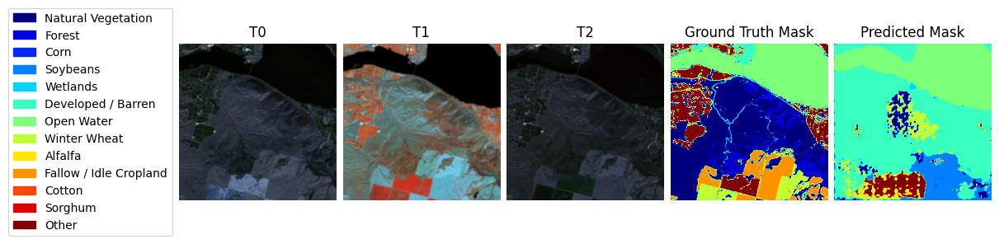

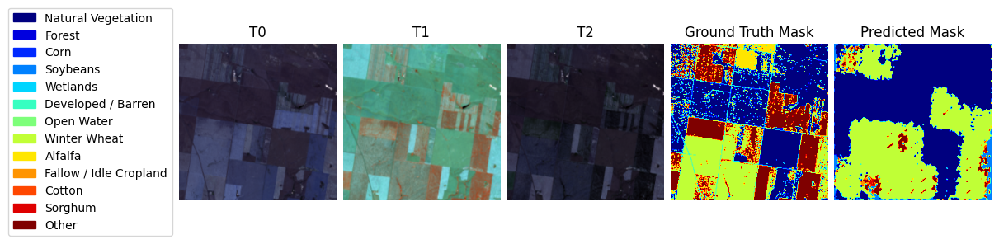

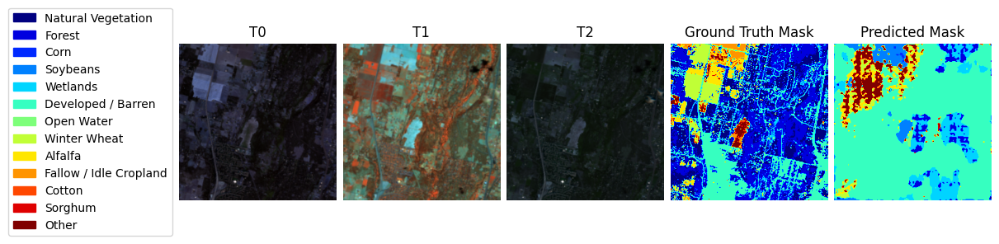

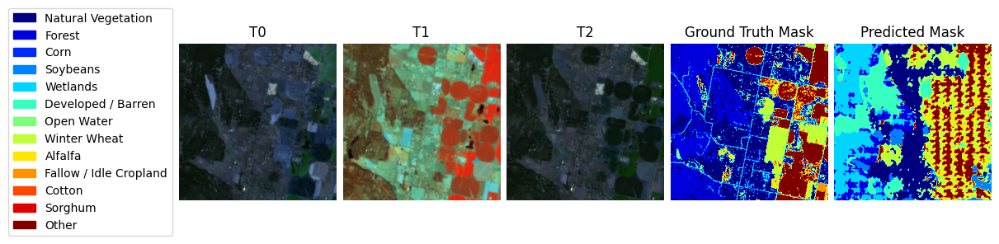

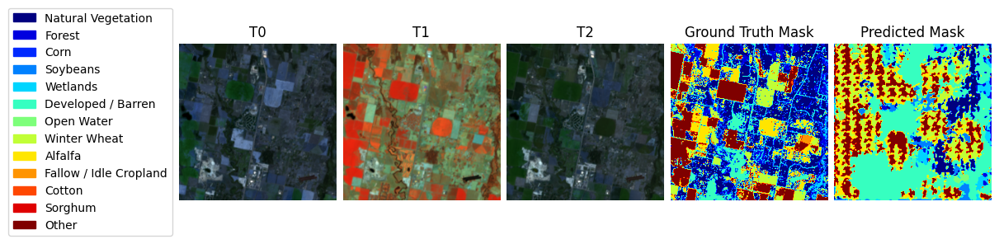

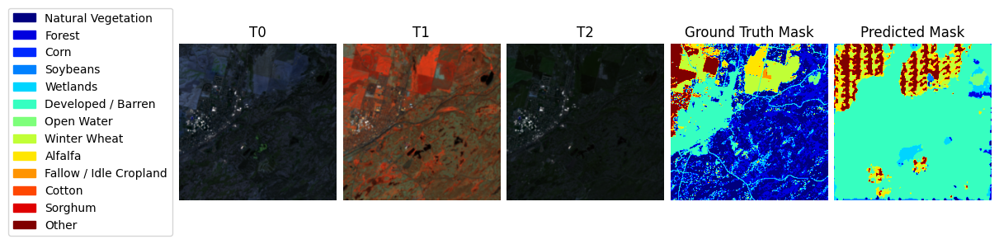

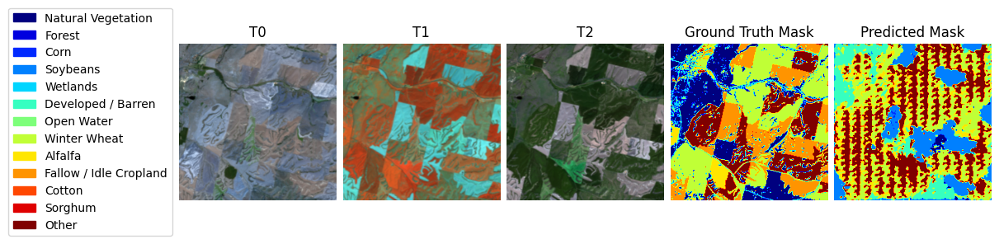

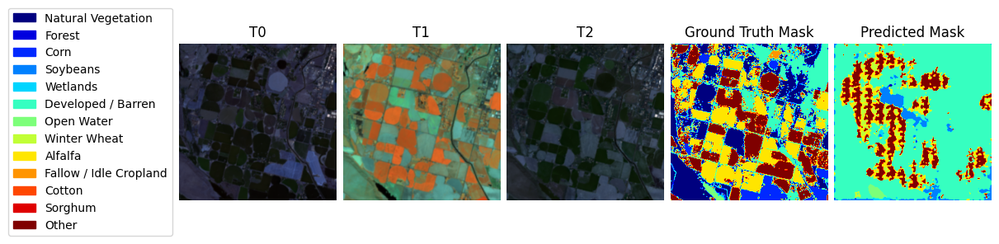

In [20]:
run_test_and_plot(model, best_ckpt_path)

In [21]:
best_ckpt_100_epoch_path = "multicrop_best-epoch=76.ckpt"

if not os.path.isfile(best_ckpt_100_epoch_path):
    gdown.download("https://drive.google.com/uc?id=1o1Hzd4yyiKyYdzfotQlEOeGTjsM8cHSw")


Restoring states from the checkpoint path at multicrop_best-epoch=76.ckpt
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
Loaded model weights from the checkpoint at multicrop_best-epoch=76.ckpt


Output()

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃             Test metric             ┃            DataLoader 0             ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│      test/Multiclass_Accuracy       │         0.5600309371948242          │
│      test/Multiclass_F1_Score       │         0.5600309371948242          │
│    test/Multiclass_Jaccard_Index    │         0.3772466778755188          │
│ test/Multiclass_Jaccard_Index_Micro │         0.3889187276363373          │
│              test/loss              │         1.3244150876998901          │
│      test/multiclassaccuracy_0      │         0.7489084601402283          │
│      test/multiclassaccuracy_1      │         0.6184440851211548          │
│     test/multiclassaccuracy_10      │         0.3405184745788574          │
│     test/multiclassaccuracy_11      │         0.5057629346847534          │
│     test/multiclassaccuracy_12      │         0.3452084958553314          │
│      test/multiclassaccuracy_2      │         0.6035131216049194          │
│      test/multiclassaccuracy_3      │         0.47803017497062683         │
│      test/multiclassaccuracy_4      │         0.5394032001495361          │
│      test/multiclassaccuracy_5      │         0.3911316990852356          │
│      test/multiclassaccuracy_6      │         0.7620816826820374          │
│      test/multiclassaccuracy_7      │         0.6053557991981506          │
│      test/multiclassaccuracy_8      │         0.4043838679790497          │
│      test/multiclassaccuracy_9      │         0.5013613700866699          │
│    test/multiclassjaccardindex_0    │         0.4586365520954132          │
│    test/multiclassjaccardindex_1    │         0.4343146085739136          │
│   test/multiclassjaccardindex_10    │         0.2467104196548462          │
│   test/multiclassjaccardindex_11    │         0.3546394109725952          │
│   test/multiclassjaccardindex_12    │         0.25727564096450806         │
│    test/multiclassjaccardindex_2    │         0.4479222297668457          │
│    test/multiclassjaccardindex_3    │         0.33904096484184265         │
│    test/multiclassjaccardindex_4    │         0.39269253611564636         │
│    test/multiclassjaccardindex_5    │         0.2909693121910095          │
│    test/multiclassjaccardindex_6    │         0.6637493371963501          │
│    test/multiclassjaccardindex_7    │         0.43035927414894104         │
│    test/multiclassjaccardindex_8    │         0.25226688385009766         │
│    test/multiclassjaccardindex_9    │         0.3356294333934784          │
└─────────────────────────────────────┴─────────────────────────────────────┘

Restoring states from the checkpoint path at multicrop_best-epoch=76.ckpt
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
Loaded model weights from the checkpoint at multicrop_best-epoch=76.ckpt


Output()

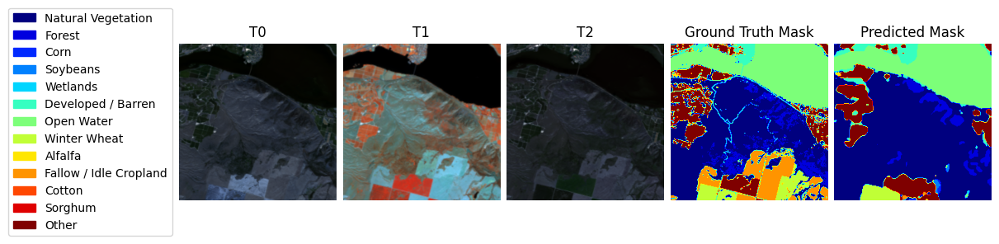

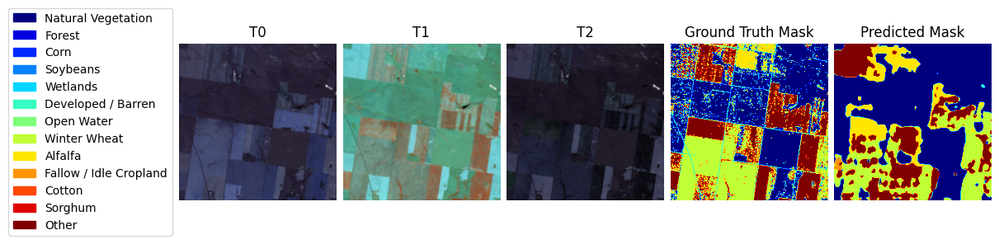

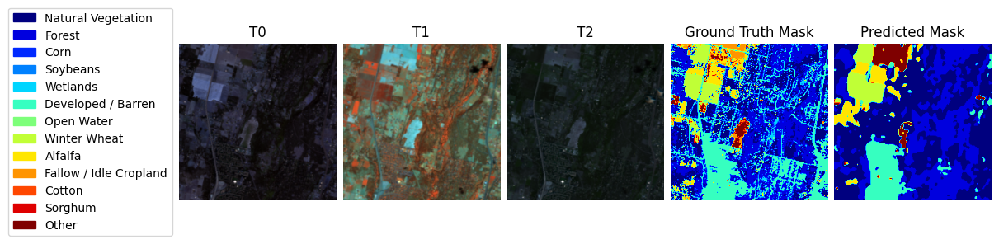

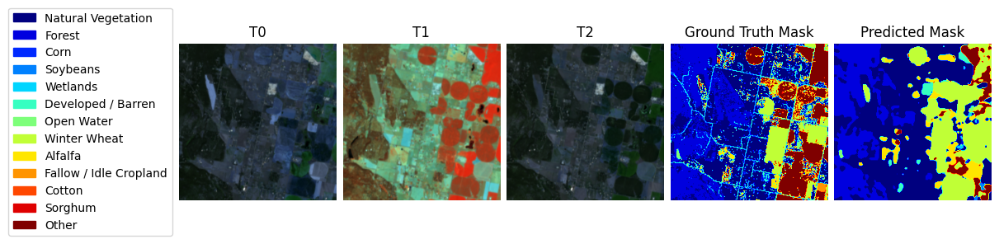

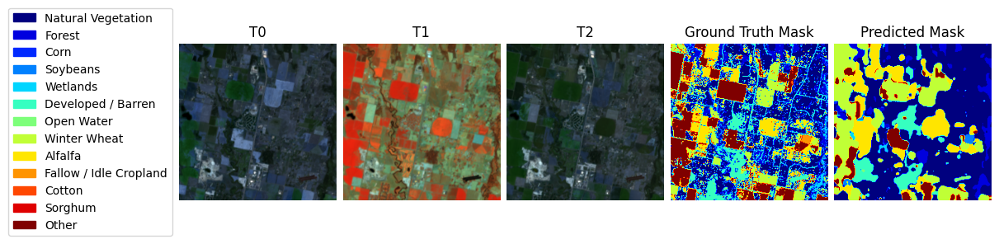

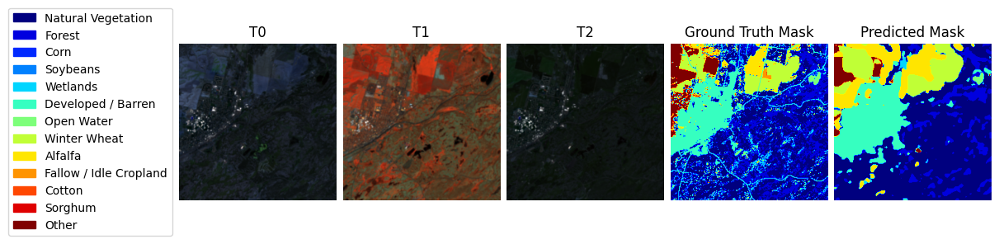

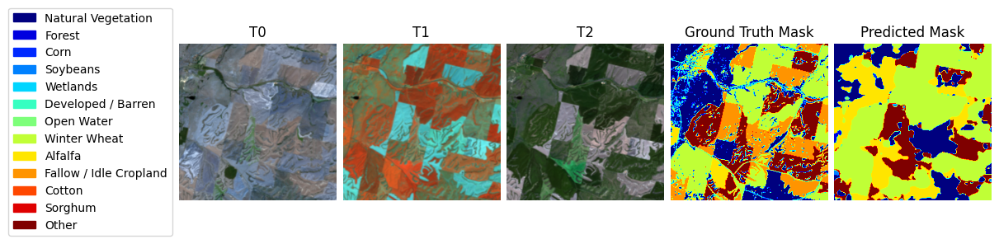

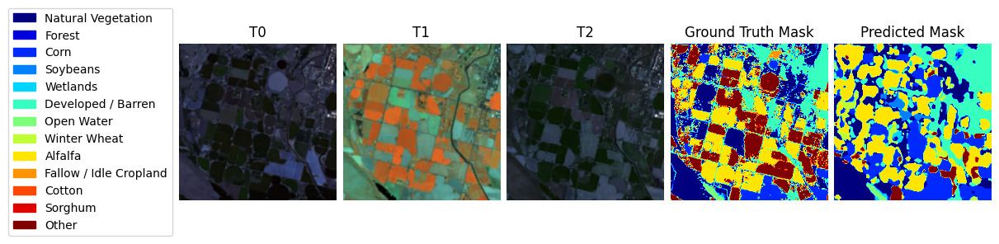

In [22]:
run_test_and_plot(model, best_ckpt_100_epoch_path)

# Fine-tuning via CLI

You might want to restart the session to free up GPU memory.

In [ ]:
# Run fine-tuning
!terratorch fit -c prithvi_v2_eo_300_tl_unet_multitemporal_crop.yaml

INFO:terratorch:granitewxc not installed, please use pip install granitewxc
Seed set to 42
INFO:root:Loaded weights for HLSBands.BLUE in position 0 of patch embed
INFO:root:Loaded weights for HLSBands.GREEN in position 1 of patch embed
INFO:root:Loaded weights for HLSBands.RED in position 2 of patch embed
INFO:root:Loaded weights for HLSBands.NIR_NARROW in position 3 of patch embed
INFO:root:Loaded weights for HLSBands.SWIR_1 in position 4 of patch embed
INFO:root:Loaded weights for HLSBands.SWIR_2 in position 5 of patch embed
/opt/app-root/lib64/python3.11/site-packages/lightning/pytorch/cli.py:681: `SemanticSegmentationTask.configure_optimizers` will be overridden by `MyLightningCLI.configure_optimizers`.
Using 16bit Automatic Mixed Precision (AMP)
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
/opt/app-root/lib64/python3.11/site-packages/lightning/pytorch/callbacks/model_checkpoint.py:654: Checkpoint directory /opt